In [1]:
%cd "C:\Users\h_agu\Desktop\machine_learning\cs224d\assignment3\codebase_release"
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import math
import time
import itertools
import shutil
import tensorflow as tf
import tree as tr
from utils import Vocab
from sklearn import decomposition
import matplotlib.cm as cm
import pandas as pd
import pickle as pickle
import sklearn as sk

C:\Users\h_agu\Desktop\machine_learning\cs224d\assignment3\codebase_release


In [2]:
RESET_AFTER = 50
class Config(object):
    """Holds model hyperparams and data information.
       Model objects are passed a Config() object at instantiation.
    """
    embed_size = 35
    #embed_size = 70
    label_size = 5
    early_stopping = 2
    anneal_threshold = 0.99
    anneal_by = 1.5
    #max_epochs = 35
    max_epochs = 1
    lr = 0.04
    l2 = 0.01
    zr = 1e-9
    model_name = 'rnn_embed=%d_l2=%f_lr=%f.weights'%(embed_size, l2, lr)

In [3]:
cfg = Config()
vocab=Vocab()

In [4]:
def load_data():
    import tree as tr
    train_data, val_data, test_data = tr.data(700, 100, 200)
    train_sentences=[t.get_words() for t in train_data]
    vocab.construct(list(itertools.chain.from_iterable(train_sentences)))
    return train_data, val_data, test_data

#train_data, val_data, test_data = load_data()

In [5]:
def load_saved(fname):
    
    with open(fname +'weigths.train.pickle','rb') as f:
        train_data=pickle.load(f)

    with open(fname+'weigths.val.pickle','rb') as f:
        val_data=pickle.load(f)
        
    with open(fname+'weigths.test.pickle','rb') as f:
        test_data=pickle.load(f)
        
    with open(fname+'weigths.vocab.pickle','rb') as f:
        vocab=pickle.load(f)

    with open(fname+'weigths.config.pickle','rb') as f:
        config=pickle.load(f)
        
    return train_data,val_data,test_data,vocab,config

In [6]:
def add_model_vars():
    with tf.variable_scope("projection"):
        U=tf.get_variable("U",[cfg.label_size , cfg.embed_size])
        bs=tf.get_variable("bs",initializer=tf.zeros_initializer(shape=[1,cfg.label_size]))
    
    with tf.variable_scope("hidden"):
        W=tf.get_variable("W",[2*cfg.embed_size, cfg.embed_size])
        b=tf.get_variable("b", initializer=tf.zeros_initializer(shape=[1,cfg.embed_size]))
        
    with tf.variable_scope("embedding"):
        embedding = tf.get_variable("embedding",[len(vocab.word_freq),cfg.embed_size])

In [7]:
def model(node):
    global tensor_nodes,labels
    #wordRef=dict()
    currentTensor=None
    
    with tf.variable_scope("embedding",reuse=True):
        embedding = tf.get_variable("embedding")  

    #print(node.label)
    if node.isLeaf:
        with tf.name_scope("input"):
            currentTensor=embedding[vocab.encode(node.word)]
        #print(node.label)
        tensor_nodes[node]=currentTensor
        labels.append(node.label)
        #print(labels)
    else:
        #tensor_nodes.update(model(node.left))
        #tensor_nodes.update(model(node.right))
        #l=[tensor_nodes[node.left]]
        #r=[tensor_nodes[node.right]]
        model(node.left)
        model(node.right)

    return tensor_nodes

In [8]:
def projection(h):
    
    #global U,bs
    with tf.variable_scope("projection",reuse=True):
        U=tf.get_variable("U")
        bs=tf.get_variable("bs")
    with tf.name_scope("node_score"):
        #h=tf.reshape(h,[1,cfg.embed_size])
        logits=tf.matmul(h,U,transpose_b=True)
        logits=logits + bs
        #yhat=tf.nn.softmax(yhat+bs)
    #yhat=np.dot(U,h)+bs
    #yhat=softmax(yhat)
    return logits

In [9]:
def predict(logits):
    return tf.argmax(logits,1)

In [10]:
def cost(logits, labels):
    with tf.variable_scope("hidden",reuse=True):
        W=tf.get_variable("W")
        b=tf.get_variable("b")

    with tf.variable_scope("projection",reuse=True):
        U=tf.get_variable("U")
        bs=tf.get_variable("bs")
    
    n=len(labels)
    lbs=tf.constant(labels)
    #lbs=tf.reshape(lbs,[1,n])
    #print("logits",tf.shape(logits),"lbs:",tf.shape(lbs))
    loss = tf.reduce_sum(tf.nn.sparse_softmax_cross_entropy_with_logits(logits,lbs, name="cross_entropy_loss")) 
    loss = loss + cfg.l2 * (tf.nn.l2_loss(W) + tf.nn.l2_loss(b) + tf.nn.l2_loss(U) + tf.nn.l2_loss(bs) )
    return loss

In [11]:
def savedTensors(sess,saver):
    global save_dir, log_dir
    time_stamp=str(time.time())
    
    with tf.variable_scope("hidden",reuse=True):
        W=tf.get_variable("W")
        b=tf.get_variable("b")
    
    with tf.variable_scope("embedding",reuse=True):
        embedding = tf.get_variable("embedding")
    
    with tf.variable_scope("projection",reuse=True):
        U=tf.get_variable("U")
        bs=tf.get_variable("bs")
        
    save_path = saver.save(sess, save_dir)
        
    U,bs,b,W,embedding = sess.run([U,bs,b,W,embedding])
    
    #u=[]
    #w=[]
    #e=[]
    
    #print("file: ", save_dir + '.W.txt')
    #print("isfile: ", os.path.isfile(save_dir + '.W.txt'))
    
   #if os.path.isfile(save_dir + '.U.txt'):
   #     u=np.loadtxt(save_dir + '.U.txt')
   #     u=u.tolist()
    
    #if os.path.isfile(save_dir + '.W.txt'):
    #    w=np.loadtxt(save_dir + '.W.txt')
    #    print("w",w.shape)
    #    w=w.tolist()
    
    #if os.path.isfile(save_dir + '.embedding.txt'):
    #    e=np.loadtxt(save_dir + '.embedding.txt')
    #    e=e.tolist()
        
    #u.append([np.ravel(np.array(U)).T.tolist()])
    #w.append([np.ravel(np.array(W)).T.tolist()])
    #e.append([np.ravel(np.array(embedding)).T.tolist()])
    
    #print("\n",len(w))
    u=[np.ravel(np.array(U)).T.tolist()]
    _bs=[np.ravel(np.array(bs)).T.tolist()]
    #print(_bs())
    w=[np.ravel(np.array(W)).T.tolist()]
    _b=[np.ravel(np.array(b)).T.tolist()]
    e=[np.ravel(np.array(embedding)).T.tolist()]
        
    np.savetxt(save_dir + '.U.' + time_stamp + '.txt', u)
    np.savetxt(save_dir + '.bs.' + time_stamp + '.txt', _bs)
    np.savetxt(save_dir + '.W.' + time_stamp + '.txt', w)
    np.savetxt(save_dir + '.b.' + time_stamp + '.txt', _b)
    np.savetxt(save_dir + '.embedding.' + time_stamp + '.txt', e)
    

In [12]:
def predictions(data, wloss=True, root=True, save_dir=None, verbose=True):
    global tensor_nodes,labels
    
    if save_dir is None :
        print("no saved file")
        return None
    
    tf.reset_default_graph()
    add_model_vars()
    sess = tf.Session()
    saver = tf.train.Saver()
    saver.restore(sess,save_dir)  
    
    root=False
    #accu=[]
    loss=[]
    tensors=[]
    lbl=[]
    
    for t in data:
        tensor_nodes=dict()
        labels=[]
        tensor_nodes=model(t.root)
        
        
        #tensors+=[t for node ,t in tensor_nodes.items() if node.label!=2]
        tensors+=[t for node ,t in tensor_nodes.items()]
        #_=[lbl.append(l) for l in labels if l!=2]
        _=[lbl.append(l) for l in labels]
        
    logits=projection(tensors)
    score=predict(logits)
    
    print(tensors)
    print(lbl)
    
    yhat=sess.run([score])
    #print(yhat)
    #print(lbl)
    #prec=tf.contrib.metrics.streaming_precision(acc,lbl)
    #prec=sess.run([prec])
    yhat=np.array(yhat[0],dtype="int64")
    lbl=np.array(lbl,dtype="int64")
    
    #print(yhat.shape)
    #print(lbl.shape)
    
    if verbose:
        print("\t\t\t\t\tactual label")
        print("\tpred","\tpos","\tneg","\t0","\t1", "\t2", "\t3", "\t4")
        for l in range(5):
            row=[]
            idx=yhat[:]==l
            tru=idx.sum()
            sets=lbl[idx]
            pos=(sets==l).sum()
            neg=sets!=l
            #actual=[]
            #print(len(sets))
            row.append(l)
            row.append(tru)
            row.append(pos)
            row.append(neg.sum())
            for a in range(5):
                cnt=(sets[neg]==a).sum()
                row.append(cnt)
                #actual.append()
            #print(actual)
        
            print(row[0],"\t",row[1],"\t",row[2],"\t",row[3],"\t",row[4],"\t",row[5],"\t",row[6],"\t",row[7],"\t",row[8])
        
    acc=np.equal(yhat,lbl).mean
    
    if wloss:
        ce=cost(logits,lbl)
        loss.append(sess.run([ce]))
            #print(len(labels))
        #loss=loss[0]/len(labels)
        #loss.append(sess.run([ce]))
    else:
        loss=0
    

    return acc,loss

In [13]:
def run_epoch(train_data, nsave=2, verbose=True, debug=True, fname=None, isNew=False):
    global save_dir,log_dir,labels, tensor_nodes
    itrain=15
    loss_history=[]
    step=0
    nsave=RESET_AFTER
    tf.reset_default_graph()
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    #isNew=False
    print("cfg.lr: ",cfg.lr)
    
    while step < len(train_data):
        #print(step)
        with tf.Graph().as_default(), tf.Session(config=config) as sess:
            add_model_vars()
            saver = tf.train.Saver()
            if isNew:
                init=tf.global_variables_initializer()
                sess.run(init)
                isNew=False
                print("\ninit global\n")
            else:
                if fname is not None:
                    #print("\nrestore fname\n")
                    fname=fname + "weigths"
                    saver.restore(sess,fname)
                    fname=None
                    
                else:
                    #print("\nrestore save_dir\n")
                    saver.restore(sess,save_dir)    
                    
            for _ in range(RESET_AFTER):
                if step == len(train_data):
                    break
                t=train_data[step]
                #with tf.name_scope("model"):
                tensor_nodes=dict()
                labels=[]
                tensor_nodes=model(t.root)
                
                #if step/9==0:
                tensors=[[t] for node,t in tensor_nodes.items()]
                labels=[l for l in labels]
                #else:
                #tensors=[[t] for node,t in tensor_nodes.items() if node.label!=2]
                #labels=[l for l in labels if l!=2]                    

                if len(tensors) > 0:
                    tensors=tf.concat(0,tensors)
                    with tf.name_scope("cross_entropy"):
                    
                    #print(tensor_nodes)
                        logits=projection(tensors)
                        pred=predict(logits)
                        loss=cost(logits,labels)
                    #tf.summary.scalar('cross-entrophy',ce)
                    op=tf.train.GradientDescentOptimizer(cfg.lr).minimize(loss)
                    

                    cx,o = sess.run([loss,op])
                    loss_history.append(cx)
                    if verbose:
                        sys.stdout.write('\r{} / {} :    loss = {}'.format(
                        step + 1, len(train_data), np.mean(loss_history)))
                        sys.stdout.flush()
                
                if step == 0 and isNew:
                    savedTensors(sess,saver)
                step=step+1
                
            if debug:
                merge=debugTensorboard()
                writer = tf.summary.FileWriter(log_dir, sess.graph) 
                cx,o,summ = sess.run([ce,op,merge])
                writer.add_summary(summ)
                step=step+1
                
            savedTensors(sess,saver)
    
    return loss_history

In [14]:
def run_epoch(train_data, nsave=2, verbose=True, debug=True, fname=None, isNew=False):
    global save_dir,log_dir,labels, tensor_nodes
    itrain=15
    loss_history=[]
    step=0
    nsave=RESET_AFTER
    tf.reset_default_graph()
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    #isNew=False
    print("cfg.lr: ",cfg.lr)
    
    while step < len(train_data):
        #print(step)
        with tf.Graph().as_default(), tf.Session(config=config) as sess:
            add_model_vars()
            saver = tf.train.Saver()
            if isNew:
                init=tf.global_variables_initializer()
                sess.run(init)
                isNew=False
                print("\ninit global\n")
            else:
                if fname is not None:
                    #print("\nrestore fname\n")
                    fname=fname + "weigths"
                    saver.restore(sess,fname)
                    fname=None
                    
                else:
                    #print("\nrestore save_dir\n")
                    saver.restore(sess,save_dir)    
                    
            for _ in range(RESET_AFTER):
                if step == len(train_data):
                    break
                t=train_data[step]
                #with tf.name_scope("model"):
                tensor_nodes=dict()
                labels=[]
                tensor_nodes=model(t.root)
                
                #if step/9==0:
                #    tensors=[[t] for node,t in tensor_nodes.items() if node.label!=2]
                #    labels=[l for l in labels if l!=2]
                #else:
                tensors=[[t] for node,t in tensor_nodes.items()]
                labels=[l for l in labels]
                
                if step == 0 and isNew:
                    savedTensors(sess,saver)
                step=step+1
            if len(tensors) > 0:
                tensors=tf.concat(0,tensors)
                with tf.name_scope("cross_entropy"):
                    logits=projection(tensors)
                    pred=predict(logits)
                    loss=cost(logits,labels)
                    #tf.summary.scalar('cross-entrophy',ce)
                op=tf.train.GradientDescentOptimizer(cfg.lr).minimize(loss)
                    

                cx,o = sess.run([loss,op])
                loss_history.append(cx)
                if verbose:
                    sys.stdout.write('\r{} / {} :    loss = {}'.format(
                    step , len(train_data), np.mean(loss_history)))
                    sys.stdout.flush()
                
            if debug:
                merge=debugTensorboard()
                writer = tf.summary.FileWriter(log_dir, sess.graph) 
                cx,o,summ = sess.run([ce,op,merge])
                writer.add_summary(summ)
                step=step+1
                
            savedTensors(sess,saver)
    
    return loss_history

In [15]:
#@profile
def train(fname=None):
    global save_dir, log_dir, train_data, val_data, test_data, vocab, cfg

    cfg=Config()
    cfg.max_epochs=12
    prev_loss=0
    loss=0
    all_train_loss=[]
    val_acc=[]
    train_acc=[]
    
    print(cfg.model_name)
    
    if True:
        start_time=str(time.time())
        log_dir=''
        log_dir="tensorboard\log\\" + start_time + "\\"
        if not os.path.exists(log_dir):
            os.makedirs(log_dir)
        save_dir=''
        save_dir="weights\\" + start_time + "\\"
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        save_dir=save_dir + "weigths"
    
    print(save_dir)
    
    for epoch in range(cfg.max_epochs):
        prev_loss=loss
        print ("\nepoch: ",epoch)
        start=time.time()
        
        if epoch == 0:
            if fname is None:
                vocab=Vocab()
                train_data, val_data, test_data = load_data()
                data = train_data
                #cfg=Config()
                loss=run_epoch(data,debug=False,isNew=True)
            else:
                #cfg = Config()
                train_data,val_data,test_data,vocab,cfg =load_saved(fname)
                #print("cfg",cfg)
                data = train_data
                loss=run_epoch(data,debug=False,fname=fname)
        else:
            #cfg=Config()
            loss=run_epoch(data,debug=False)
        #all_train_loss.append(loss)
        all_train_loss+=[l for l in loss]
        loss=np.mean(loss)
        end=time.time()
        runtime=end-start
        print ("\nepoch ",epoch," end in ",runtime," seconds, loss: ",loss)
        if epoch !=0 and prev_loss * cfg.anneal_threshold < loss:
            cfg.lr/=cfg.anneal_by
            print('annealed lr to %f'%cfg.lr)
        
        shutil.copyfile(save_dir + ".data-00000-of-00001", save_dir + ".data." + str(epoch))
        shutil.copyfile(save_dir + ".index", save_dir + ".index." + str(epoch))
        shutil.copyfile(save_dir + ".meta", save_dir + ".meta." + str(epoch))
        
        # calc validation acc
        print("validation:")
        val_acc,val_loss=predictions(val_data, wloss=True, root=True, save_dir=save_dir, verbose=False)
        print("val_acc:", val_acc(), " val_loss:",np.mean(val_loss)/len(val_data))
        # calc train acc
        print("test:")
        test_acc, test_loss=predictions(test_data, wloss=False, root=False, save_dir=save_dir, verbose=False)
        print("test_acc:", test_acc(), " val_loss:") #,np.mean(test_loss)/len(test_data))
        print("train:")
        train_acc,train_loss=predictions(train_data, wloss=True, root=True, save_dir=save_dir, verbose=True)
        print("train_acc:", train_acc(), " val_loss:",np.mean(train_loss)/len(train_data))
        end=time.time()
        
        runtime=end-start
        
        print("total time:",runtime)
        
    # save loss
    np.savetxt(save_dir+'.' + cfg.model_name + '.loss.txt',np.array(all_train_loss))
    
    with open(save_dir+'.train.pickle','wb') as f:
        pickle.dump(train_data,f,0)

    with open(save_dir+'.val.pickle','wb') as f:
        pickle.dump(val_data,f,0)
        
    with open(save_dir+'.test.pickle','wb') as f:
        pickle.dump(test_data,f,0)
        
    with open(save_dir+'.vocab.pickle','wb') as f:
        pickle.dump(vocab,f,0)
        
    with open(save_dir+'.config.pickle','wb') as f:
        pickle.dump(cfg,f,0)
    # save accuracies

In [18]:
train()

rnn_embed=35_l2=0.040000_lr=0.050000.weights
weights\1502790008.0571232\weigths

epoch:  0
Loading train trees..
Loading dev trees..
Loading test trees..
pos+:  1852  pos:  3111  neut:  2242  neg:  3140  neg+:  1510
3121.0 total words with 1162 uniques
cfg.lr:  0.05

init global

701 / 700 :    loss = 6.7405633926391655
epoch  0  end in  52.12663388252258  seconds, loss:  6.74056
validation:
val_acc: 0.779874213836  val_loss: 5.95163818359
test:
test_acc: 0.79405204461  val_loss:
train:
					actual label
	pred 	pos 	neg 	0 	1 	2 	3 	4
0 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
1 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
2 	 3121 	 2360 	 761 	 80 	 251 	 0 	 317 	 113
3 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
4 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
train_acc: 0.756167894905  val_loss: 4.35772321429
total time: 98.58692407608032

epoch:  1
cfg.lr:  0.05
701 / 700 :    loss = 4.9963278770446785
epoch  1  end in  48.06498456001282  seconds, loss:  4.99633
validation:
val_acc: 0.779874213836  val_loss: 5.42833618164
test:

In [49]:
fname='weights\\1502790008.0571232\\'

In [ ]:
train(fname=fname)

rnn_embed=35_l2=0.040000_lr=0.020000.weights
weights\1502793099.2230332\weigths

epoch:  0
cfg <__main__.Config object at 0x000001DF467D9780>
cfg.lr:  0.02
700 / 700 :    loss = 4.5373215675354915
epoch  0  end in  373.5919210910797  seconds, loss:  4.53732
validation:
val_acc: 0.779874213836  val_loss: 5.09550231934
test:
test_acc: 0.79405204461  val_loss:
train:
					actual label
	pred 	pos 	neg 	0 	1 	2 	3 	4
0 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
1 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
2 	 3121 	 2360 	 761 	 80 	 251 	 0 	 317 	 113
3 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
4 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 0
train_acc: 0.756167894905  val_loss: 3.79144182478
total time: 429.6811146736145

epoch:  1
cfg.lr:  0.02
700 / 700 :    loss = 4.0748686790466315
epoch  1  end in  381.31681513786316  seconds, loss:  4.07487
validation:
val_acc: 0.779874213836  val_loss: 5.08792419434
test:
test_acc: 0.79405204461  val_loss:
train:
					actual label
	pred 	pos 	neg 	0 	1 	2 	3 	4
0 	 0 	 0 	 0 	 0 	 0 	 0 	 0 	 

In [16]:
fname='weights\\1503335920.9408576\\epoch6\\weigths'
add_model_vars()
with tf.Session() as sess:
    saver=tf.train.Saver()
    saver.restore(sess,fname)
    with tf.variable_scope("embedding",reuse=True):
        embedding = tf.get_variable("embedding")
    embed = sess.run([embedding])

InvalidArgumentError: Unsuccessful TensorSliceReader constructor: Failed to get matching files on weights\1503335920.9408576\epoch6\weigths: Not found: FindFirstFile failed for: weights/1503335920.9408576/epoch6 : The system cannot find the path specified.

	 [[Node: save/RestoreV2_4 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_recv_save/Const_0, save/RestoreV2_4/tensor_names, save/RestoreV2_4/shape_and_slices)]]

Caused by op 'save/RestoreV2_4', defined at:
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\kernelapp.py", line 474, in start
    ioloop.IOLoop.instance().start()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\zmq\eventloop\ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tornado\ioloop.py", line 887, in start
    handler_func(fd_obj, events)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tornado\stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\zmq\eventloop\zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\zmq\eventloop\zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\zmq\eventloop\zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tornado\stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\kernelbase.py", line 276, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\kernelbase.py", line 228, in dispatch_shell
    handler(stream, idents, msg)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\kernelbase.py", line 390, in execute_request
    user_expressions, allow_stdin)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\zmqshell.py", line 501, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\IPython\core\interactiveshell.py", line 2717, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\IPython\core\interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\IPython\core\interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-16-6f5b9112eb5d>", line 4, in <module>
    saver=tf.train.Saver()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\training\saver.py", line 1000, in __init__
    self.build()
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\training\saver.py", line 1030, in build
    restore_sequentially=self._restore_sequentially)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\training\saver.py", line 624, in build
    restore_sequentially, reshape)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\training\saver.py", line 361, in _AddRestoreOps
    tensors = self.restore_op(filename_tensor, saveable, preferred_shard)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\training\saver.py", line 200, in restore_op
    [spec.tensor.dtype])[0])
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\ops\gen_io_ops.py", line 441, in restore_v2
    dtypes=dtypes, name=name)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\framework\op_def_library.py", line 759, in apply_op
    op_def=op_def)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\framework\ops.py", line 2240, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\tensorflow\python\framework\ops.py", line 1128, in __init__
    self._traceback = _extract_stack()

InvalidArgumentError (see above for traceback): Unsuccessful TensorSliceReader constructor: Failed to get matching files on weights\1503335920.9408576\epoch6\weigths: Not found: FindFirstFile failed for: weights/1503335920.9408576/epoch6 : The system cannot find the path specified.

	 [[Node: save/RestoreV2_4 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_recv_save/Const_0, save/RestoreV2_4/tensor_names, save/RestoreV2_4/shape_and_slices)]]


In [40]:
embed2=embeddings[len(embeddings)-2]
embed2=np.array(embed2).reshape([1162,35])

In [1]:
fname='c://Users/h_agu/Desktop/machine_learning/cs224d/assignment3/codebase_release/weights/1502790008.0571232/'
_embeddings=np.loadtxt(fname + 'weigths.embedding.txt')
_bs=np.loadtxt(fname + 'weigths.bs.txt')
_U=np.loadtxt(fname + 'weigths.U.txt')
#b_=np.loadtxt(fname + 'weigths.b.txt')
#Ws=np.loadtxt(fname + 'weigths.W.txt')

with open(fname +'weigths.train.pickle','rb') as f:
        train_data=pickle.load(f)

with open(fname+'weigths.val.pickle','rb') as f:
        val_data=pickle.load(f)
        
with open(fname+'weigths.test.pickle','rb') as f:
        test_data=pickle.load(f)
        
with open(fname+'weigths.vocab.pickle','rb') as f:
        vocab=pickle.load(f)

NameError: name 'np' is not defined

In [15]:
fname="weights\\1502899761.548873\\"
train_data,val_data,test_data,vocab,cfg = load_saved(fname)
print(cfg.model_name)

rnn_embed=35_l2=0.010000_lr=0.040000.weights


In [21]:
#add_model_vars()
fname="weights\\1502899761.548873\\epoch6\\weigths"
train_acc,train_loss=predictions(train_data, wloss=True, root=True, save_dir=fname, verbose=True)
print("train_acc:", train_acc(), " val_loss:",np.mean(train_loss)/len(train_data))

					actual label
	pred 	pos 	neg 	0 	1 	2 	3 	4
0 	 33 	 14 	 19 	 0 	 1 	 15 	 3 	 0
1 	 292 	 88 	 204 	 12 	 0 	 176 	 15 	 1
2 	 2382 	 1916 	 466 	 44 	 138 	 0 	 203 	 81
3 	 319 	 89 	 230 	 9 	 21 	 191 	 0 	 9
4 	 95 	 22 	 73 	 1 	 3 	 62 	 7 	 0
train_acc: 0.68215315604  val_loss: 5.96664411272


In [138]:
add_model_vars()
saver=tf.train.Saver()
save_dir=fname + 'weigths'

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
tensor_nodes=dict()
labels=[]
tensor_nodes=model(train_data[7].root)
tensors=[t for idx,t in tensor_nodes.items()]
logits=projection(tensors)
pred=predict(logits)
loss = tf.reduce_sum(tf.nn.sparse_softmax_cross_entropy_with_logits(logits,labels, name="cross_entropy_loss")) 

#with tf.Graph().as_default(),tf.Session() as sess:
with tf.Session() as sess:
    #
    #init=tf.global_variables_initializer()
    #sess.run(init)
    saver.restore(sess,save_dir)
    ce,yhat,log,ten=sess.run([loss,pred,logits,tensors])

In [45]:
yhat=np.array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3], dtype="int64")

lbl = [3, 3, 1, 4, 3, 3, 1, 0, 1, 3, 1, 3, 1, 3, 1, 3, 3, 3, 1, 1, 4, 3, 3, 4, 1, 1, 3, 4, 1, 1, 3, 3, 3, 3, 4, 0, 4, 1, 3, 4, 3, 3, 3, 4, 3, 1, 3, 0, 3, 0, 1, 3, 1, 4, 1, 4, 3, 4, 1, 4, 3, 3, 3, 1, 1, 3, 3, 3, 1, 4, 3, 3, 3, 0, 1, 3, 1, 4, 1, 1, 1, 1, 1, 3, 0, 3, 1, 3, 3, 0, 3, 3, 4, 3, 1, 3, 0, 0, 4, 3, 3, 0, 4, 3, 3, 3, 0, 1, 1, 3, 4, 3, 1, 1, 1, 3, 1, 3, 3, 0, 3, 1, 4, 3, 3, 3, 4, 4, 1, 0, 1, 1, 1, 4, 3, 1, 0, 3, 1, 3, 4, 3, 1, 1, 1, 3, 3, 3, 4, 3, 3, 4, 4, 4, 4, 4, 3, 3, 3, 4, 3, 3, 3, 3, 0, 0, 3, 3, 1, 0, 1, 3, 3, 1, 3, 0, 4, 3, 3, 3, 3, 1, 1, 4, 1, 3, 4, 4, 0, 3, 3, 0, 3, 1, 0, 3, 3, 4, 1, 3, 1, 3, 1, 3, 3, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 4, 4, 1, 1, 1, 3, 4, 4, 3, 1, 1, 1, 3, 4, 3, 3, 1, 4, 4, 3, 3, 3, 1, 4, 3, 1, 4, 1, 1, 0, 3, 3, 0, 1, 4, 3, 3, 3, 3, 3, 1, 1, 1, 0, 3, 1, 3, 1, 0, 3, 4, 4, 3, 1, 3, 0, 0, 1, 0, 3, 4, 0, 3, 3, 3, 1, 1, 1, 1, 1, 3, 1, 3, 0, 3, 4, 3, 3, 0, 1, 0, 1, 1, 3, 1, 1, 1, 1, 3, 1, 0, 3, 1, 3, 3, 3, 3, 4, 1, 0, 0, 3, 3, 3, 3, 0, 3, 1, 1, 3, 3, 0, 1, 3, 1, 1, 1, 3, 4, 3, 4, 4, 3, 4, 0, 4, 3, 1, 0, 1, 1, 1, 4, 4, 4, 3, 3, 1, 0, 4, 1, 3, 4, 3, 3, 4, 4, 1, 3, 4, 4, 3, 0, 1, 0, 4, 3, 3, 3, 1, 0, 3, 1, 1, 0, 3, 1, 1, 1, 1, 1, 1, 3, 3, 0, 3, 1, 3, 1, 3, 0, 3, 3, 1, 3, 3, 3, 1, 1, 3, 3, 4, 1, 3, 0, 3, 3, 1, 1, 3, 1, 1, 1, 3, 3, 3, 4, 4, 3, 3, 3, 1, 4, 4, 3, 1, 3, 1, 3, 3, 4, 3, 1, 3, 3, 3, 1, 3, 1, 1, 4, 3, 0, 3, 3, 3, 0, 4, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 3, 1, 1, 1, 3, 1, 1, 3, 3, 3, 4, 1, 1, 0, 4, 0, 0, 1, 3, 1, 4, 1, 1, 0, 0, 3, 0, 3, 1, 0, 1, 1, 4, 1, 3, 3, 3, 3, 3, 4, 3, 3, 1, 1, 1, 3, 3, 3, 3, 3, 3, 4, 3, 4, 3, 1, 3, 4, 1, 1, 1, 3, 1, 1, 1, 3, 3, 3, 4, 3, 1, 1, 3, 1, 0, 3, 3, 1, 3, 1, 0, 1, 0, 1, 4, 1, 1, 4, 1, 1, 3, 3, 1, 1, 1, 4, 3, 0, 3, 3, 1, 3, 1, 4, 1, 3, 1, 1, 1, 3, 1, 1, 3, 3, 4, 3, 1, 3, 3, 3, 1, 4, 3, 3, 4, 3, 1, 3, 4, 3, 1, 1, 4, 1, 3, 4, 3, 3, 3, 1, 0, 4, 3, 3, 4, 1, 3, 4, 3, 3, 3, 1, 1, 1, 1, 4, 1, 0, 3, 1, 0, 3, 1, 1, 3, 3, 3, 4, 1, 3, 1, 3, 1, 1, 3, 3, 3, 3, 1, 0, 1, 4, 4, 1, 4, 1, 1, 1, 0, 3, 4, 1, 1, 4, 3, 3, 3, 1, 3, 4, 3, 1, 4, 3, 4, 3, 3, 0, 1, 3, 3, 3, 1, 1, 1, 1, 1, 0, 3, 0, 1, 3, 0, 3, 3, 1, 1, 1, 3, 3, 1, 0, 1, 3, 3, 3, 3, 3, 1, 4, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 4, 1, 3, 3, 0, 3, 1, 1, 3, 4, 4, 3, 3, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 3, 1, 1, 0, 3, 1, 1, 0, 1, 4, 1, 1, 1]

In [118]:
ce

6.4492197

In [139]:
labels

[1, 1, 2, 1]

In [96]:
train_data[7].labels

[1, 1, 2, 1, 1, 1, 1]

In [83]:
train_data[0].labels

[2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0]


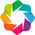

In [7]:
import holoviews as hv
hv.extension('bokeh')

In [8]:
em=embeddings[len(embeddings)-1]
em=em.reshape(len(vocab.word_freq),cfg.embed_size)

In [9]:
ras=hv.Raster(em)
ras

:Raster   [x,y]   (z)

In [45]:
embd=embeddings[0:10]
ras2=hv.Raster(embd)
%opts Raster [height=200 width=3600]
ras2

:Raster   [x,y]   (z)

In [43]:
embd.shape

(10, 40670)

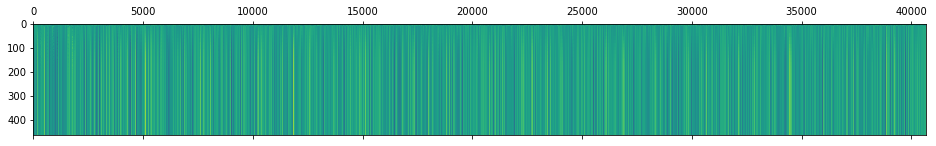

In [6]:
plt.matshow(embeddings)
plt.gca().set_aspect('auto')
plt.show()

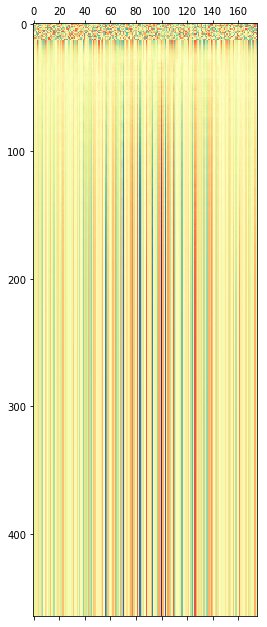

In [13]:

plt.matshow(Us,cmap=cm.Spectral_r,interpolation='none', vmin=np.min(Us), vmax=np.max(Us))
plt.gca().set_aspect('auto')
plt.show()

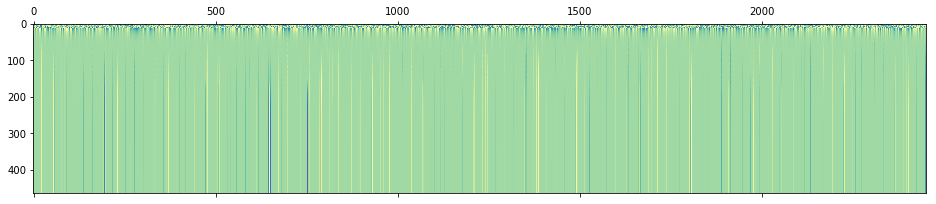

In [12]:
plt.matshow(Ws,cmap=cm.Spectral_r,interpolation='none', vmin=np.min(Ws), vmax=np.max(Ws))
plt.gca().set_aspect('auto')
plt.show()

In [6]:
em=embeddings[len(embeddings)-1]
em=em.reshape(len(vocab.word_freq),cfg.embed_size)
U=Us[len(Us)-1].reshape(cfg.label_size , cfg.embed_size)
W=Ws[len(Ws)-1].reshape(2*cfg.embed_size, cfg.embed_size)
bs=b_s[len(b_s)-1].reshape(cfg.label_size)
b=b_[len(b_)-1].reshape(cfg.embed_size)

In [13]:
w,h=embeddings.shape
print(h,w)

40670 465


In [19]:
len(embeddings[0])

40670

In [14]:
X=[]
Y=[]
Z=[]
for x in range(w):
    for y in range(h):
        #print(embeddings[x,y])
        X.append(x)
        Y.append(y)
        Z.append(embeddings[x,y])
embed=dict({'x':X, 'y':Y, 'z':Z})  
embed_dat=pd.DataFrame.from_dict(embed)

In [20]:
em_delt=[]
for x in range(w):
    if x > 0:
       em_delt.append(embeddings[x]-embeddings[x-1])

In [38]:
ras3=hv.Raster(np.array(em_delt[1]).reshape(len(vocab.word_freq),cfg.embed_size))
plot_opts=dict(width=500, height=500)
%opts Raster [height=1800 width=1800]
ras3()

:Raster   [x,y]   (z)

-13.887855548518019

In [12]:
embed_dat.tail()

,x,y,z
18911545,464,40665,0.133963
18911546,464,40666,0.025248
18911547,464,40667,-0.016350
18911548,464,40668,-0.058094
18911549,464,40669,0.001393


In [9]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [18]:
%%time
plot_width  = int(750)
plot_height = int(plot_width//1.2)
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height)# , x_range=(0), y_range=(y_range))
agg = cvs.points(embed_dat, 'x', 'y',  ds.sum('z'))
img = tf.shade(agg, cmap=cm.coolwarm, how='linear')

Wall time: 875 ms


C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\matplotlib\colors.py:494: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


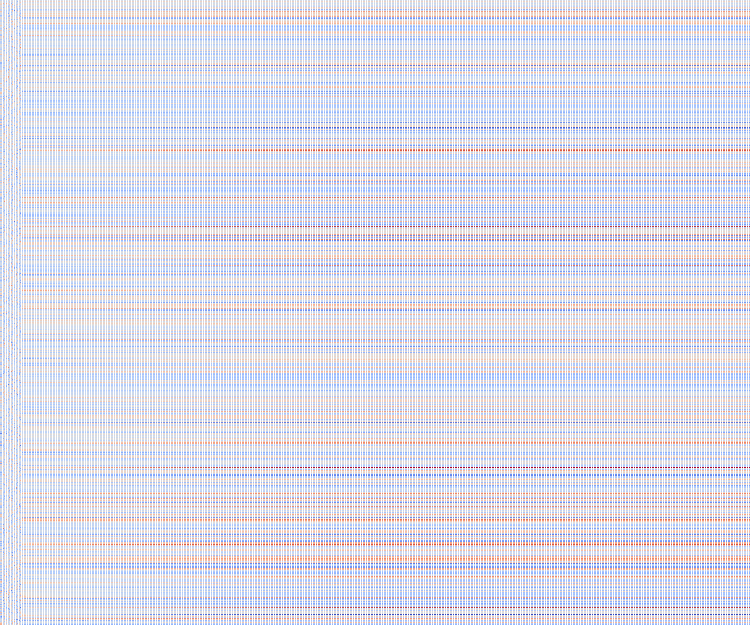

In [19]:
img

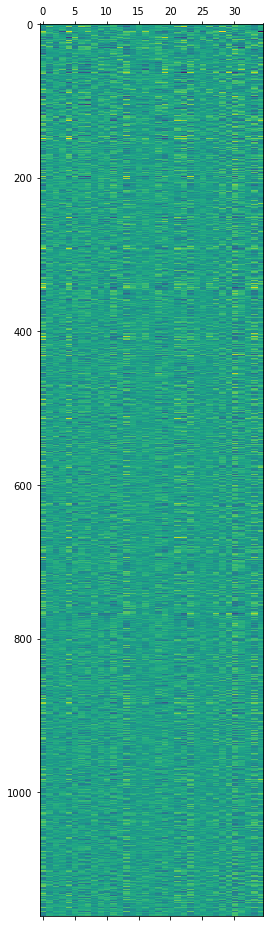

In [13]:
plt.matshow(em)
plt.gca().set_aspect('auto')
plt.show()

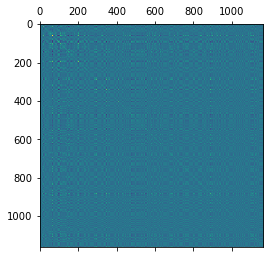

In [14]:
em_x=np.dot(em,em.T)

#fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.matshow(em_x)
plt.gca().set_aspect('auto')
plt.show()
#mt.figure(figsize=(1

In [12]:
res=np.argmax(np.dot(em, U.T),axis=1)
w_idx=np.where(res==0)[0]
for id in w_idx:
    #print(id)
    print(vocab.decode(id))

rashomon-for-dipsticks
ending
puzzling
full
of
poo
gong
story
fact
?
delete
doa
capable
quiet
haunting
miscalculation
hilarious
kathy
priceless
consistently
point
originality
lacking
daft
gone
predictably
baaaaaaaaad
watchable
unfunny
thanks
brit
go
indulgence
drek
salaciously
black-and-white
affectionate
niro
powers
sucked
well-made
sap
deadpan
cares
sex
tired
nonsense
conceited
hope
genuinely
unnerving
how
twist
right
definitely
seeing
comedy\/thriller
charlie
disjointed
ghastly
lite
resist
cast
riot
jason
friggin
picture
remarkably
morton
pain
craft
processor
poetic
possible
self-indulgent
action-comedy
greatness


In [24]:
e=np.array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.04562523,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.11633216,  0.        ,  0.43318084,  0.        ,
        0.        ,  0.39075494,  0.0077282 ,  0.04669641,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.06460555,  0.        ])

In [30]:
np.argmax(U.dot(e))

3

In [7]:
import pickle

In [10]:
with open('data2.pickle', 'wb') as f:
    pickle.dump(val_data,f,1)

In [12]:
with open('data2.pickle', 'rb') as f:
    data=pickle.load(f)

In [14]:
val_data

In [9]:
from bokeh.plotting import figure, show
#from bokeh.models import LabelSet, ColumnDataSource, Arrow
from bokeh.io import output_notebook, push_notebook
from bokeh.layouts import layout
from bokeh.charts import HeatMap
from bokeh.models import (
    ColumnDataSource, HoverTool, SingleIntervalTicker, Slider, Button, Label,
    CategoricalColorMapper, LabelSet
)
output_notebook()

Loading BokehJS ...

In [10]:
hm=HeatMap(embed,x='x',y='y',values='z')
show(hm)

KeyboardInterrupt: 

In [ ]:
from bokeh.models import LinearColorMapper,ColorBar

emin=np.min(em_x)
emax=np.max(em_x)
#print(emin,emax)
color_mapper = LinearColorMapper(palette="Viridis256", low=emin, high=emax)
#plot = figure(x_range=(emin,emax), y_range=(emin,emax), toolbar_location=None)
plot = figure(x_range=(0,1162), y_range=(0,1162), toolbar_location=None, plot_width=800, plot_height=800)
plot.image([em_x],dh=[1162], dw=[1162], x=0, y=0, color_mapper=color_mapper)
color_bar = ColorBar(color_mapper=color_mapper, 
                     label_standoff=12, border_line_color=None, location=(0,0))
plot.add_layout(color_bar, 'right')
show(plot)

In [ ]:
embeddings[134,40669]

In [ ]:
em_max=embeddings.max()
em_min=embeddings.min()
color_mapper2 = LinearColorMapper(palette="Viridis256", low=em_min, high=em_max)
plot2 = figure(x_range=(0,135), y_range=(0,40670), toolbar_location=None)
plot2.image(image=[embeddings],dh=[40670], dw=[135], x=0, y=0, color_mapper=color_mapper2)
color_bar2 = ColorBar(color_mapper=color_mapper2, 
                     label_standoff=12, border_line_color=None, location=(0,0))
plot2.add_layout(color_bar2, 'right')
show(plot2)

In [71]:
color_mapper.

In [72]:
a

In [33]:
import numpy as np
from matplotlib.mlab import bivariate_normal

from bokeh.models import LogColorMapper, LogTicker, ColorBar

#output_file('color_bar.html')

N = 100
X, Y = np.mgrid[-3:3:complex(0, N), -2:2:complex(0, N)]
Z1 = bivariate_normal(X, Y, 0.1, 0.2, 1.0, 1.0) +  \
    0.1 * bivariate_normal(X, Y, 1.0, 1.0, 0.0, 0.0)
image = Z1 * 1e6

color_mapper = LogColorMapper(palette="Viridis256", low=1, high=1e7)

plot = figure(x_range=(0,1), y_range=(0,1), toolbar_location=None, plot_width=600, plot_height=600)
plot.image(image=[image], color_mapper=color_mapper,
           dh=[1.0], dw=[1.0], x=[0], y=[0])

color_bar = ColorBar(color_mapper=color_mapper, ticker=LogTicker(),
                     label_standoff=12, border_line_color=None, location=(0,0))

plot.add_layout(color_bar, 'right')

show(plot)

In [26]:
N = 500
x = np.linspace(0, 10, N)
y = np.linspace(0, 10, N)
xx, yy = np.meshgrid(x, y)
d = np.sin(xx)*np.cos(yy)

p = figure(x_range=(0, 10), y_range=(0, 10))

# must give a vector of image data for image parameter
p.image(image=[d], x=0, y=0, dw=10, dh=10, palette="Spectral11")

show(p)

In [30]:
x.shape

(500,)

In [24]:
print(d.max(),d.min())

0.999998503916 -0.999995589129


In [1]:
def get_pca(embed,idx,n_component=2):
    x=[embed[idx[i]] for i in range(len(idx))]
    pca = decomposition.PCA(n_component)
    pca.fit(embed)
    return pca.transform(x)

C:\Users\h_agu\Desktop\machine_learning\cs224d\assignment3\codebase_release


In [4]:
import matplotlib.pyplot as plt

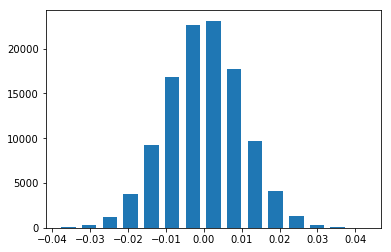

In [13]:
a=np.random.normal(size=[70,1578],scale=0.01)
#a=np.random.uniform(low=-0.02,high=0.02,size=[1578,70])
hist, bins = np.histogram(a, bins=15)
width = 0.7 * (bins[1] - bins[0])
center = (bins[:-1] + bins[1:]) / 2
plt.bar(center, hist, align='center', width=width)
plt.show()

In [5]:
data=np.loadtxt('embed/embed_1493217378')

In [14]:
a.sum()

6.8472294185667106

In [25]:
#data=np.loadtxt('embed/embed_1493217378')
rand_words_idx=np.random.random_integers(1,1571,size=[10])
pca=[]
for i, slice in enumerate(data):
    pca.append(get_pca(np.reshape(slice,[-1,35]),rand_words_idx))
        

C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\__main__.py:2: DeprecationWarning: This function is deprecated. Please call randint(1, 1571 + 1) instead
  from ipykernel import kernelapp as app


In [31]:
pca

[array([[-0.02889683,  0.00729056],
        [ 0.02636868, -0.01457073],
        [ 0.03851529,  0.03971171],
        [ 0.00300934,  0.00608019],
        [-0.01591761,  0.01993266],
        [ 0.00875438, -0.01359093],
        [ 0.01708168,  0.04516449],
        [-0.01746614, -0.02154329],
        [ 0.03785424, -0.00305186],
        [-0.0390545 , -0.04278936]]), array([[-0.00692032,  0.04059059],
        [ 0.04145933,  0.0106883 ],
        [-0.05529916,  0.03154619],
        [ 0.03890864, -0.01174008],
        [-0.04551493,  0.00267408],
        [ 0.0017507 ,  0.02306549],
        [-0.0104186 , -0.00400932],
        [-0.01155405, -0.00190913],
        [ 0.03417169, -0.00042578],
        [-0.00700199, -0.01246788]]), array([[ 0.03565691,  0.00414778],
        [ 0.00042958,  0.00015165],
        [-0.01260809, -0.00591857],
        [ 0.01919464,  0.04063818],
        [ 0.0137529 ,  0.01093755],
        [ 0.05857664,  0.0165109 ],
        [ 0.0163435 , -0.01496048],
        [ 0.0122051 , -0.0

In [23]:
rand_words_idx=np.random.random_integers(1,1571,size=[10])

C:\Users\h_agu\Desktop\machine_learning\Anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: This function is deprecated. Please call randint(1, 1571 + 1) instead
  if __name__ == '__main__':


In [9]:
210/7

30.0

In [13]:
slice0=data[0]
new=np.reshape(slice0,[-1,35])

In [14]:
new.shape

(1568, 35)

In [19]:
new=np.reshape(slice0,[-1,35])
pca0=get_pca(new,rand_words_idx)

In [22]:
len(pca0)

100

In [32]:
a = dict()

In [33]:
a[1]='a'

In [34]:
a

{1: 'a'}

In [1]:
from guppy import hpy; h=hpy()

ImportError: No module named 'guppy'